# Convolution

In [1]:
# DL framework
import tensorflow as tf
import tensorflow.contrib.eager as tfe
tfe.enable_eager_execution()

from datetime import datetime

# common packages
import numpy as np
import os # handling file i/o
import sys
import math
import time # timing epochs

# for ordered dict when building layer components
import collections

# plotting pretty figures
%matplotlib inline
import matplotlib
import matplotlib.pyplot as plt
from matplotlib import pyplot
from matplotlib import colors # making colors consistent
from mpl_toolkits.axes_grid1 import make_axes_locatable # colorbar helper

# read image
from imageio import imread
# + data augmentation
from scipy import ndimage
from scipy import misc

# used for manually saving best params
import pickle

# for shuffling data batches
from sklearn.utils import shuffle

# const
SEED = 42

# Helper to make the output consistent
def reset_graph(seed=SEED):
    tf.reset_default_graph()
    tf.set_random_seed(seed)
    np.random.seed(seed)

# helper to create dirs if they don't already exist
def maybe_create_dir(dir_path):
    if not os.path.exists(dir_path):
        os.makedirs(dir_path)
        print("{} createed".format(dir_path))
    else:
        print("{} already exists".format(dir_path))
    
# set log level to supress messages, unless an error
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

# Important Version information
print("Python: {}".format(sys.version_info[:]))
print('TensorFlow: {}'.format(tf.__version__))

# Check if using GPU
if not tf.test.gpu_device_name():
    print('No GPU found')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))
    
reset_graph()

Python: (3, 5, 4, 'final', 0)
TensorFlow: 1.5.0-dev20171220
No GPU found


In [2]:
# `/output_images` will hold, you guessed it, output images
INPUT_DIR = "./dependencies"
OUTPUT_DIR = "./output_images"
maybe_create_dir(OUTPUT_DIR)

./output_images already exists


In [3]:
def implot(img, ax):
    im = ax.imshow(img.astype(np.uint8), interpolation="nearest")
    ax.set_axis_off()
    
# helper to plot images side-by-side, and save, if requested
def plot_side_by_side(image_a, image_b, SAVE_FIG_TO_OUTPUT=None):
    fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, sharey=True, figsize=(16,8))

    implot(image_a, ax1)
    implot(image_b, ax2)

    plt.grid('off')
    plt.tight_layout()
    
    if SAVE_FIG_TO_OUTPUT:
        name_str = '{}.png'.format(SAVE_FIG_TO_OUTPUT)
        plt.savefig(os.path.join(OUTPUT_DIR, name_str), dpi=300)
        print(name_str + " saved to disk")
    
    plt.show()

def plot_single_image(image, SAVE_FIG_TO_OUTPUT=None):
    fig, (ax1) = plt.subplots(nrows=1, ncols=1, sharey=True, figsize=(10,10))
    implot(image, ax1)
    plt.grid('off')
    plt.tight_layout()
    if SAVE_FIG_TO_OUTPUT:
        name_str = '{}.png'.format(SAVE_FIG_TO_OUTPUT)
        plt.savefig(os.path.join(OUTPUT_DIR, name_str), dpi=300)
        print(name_str + " saved to disk")
    
    plt.show()

## Get image online to experiement with
1. visit the Google machine
2. search images, (select license type - `reuse w/modification`)
3. download -- I placed the image in the `./dependencies` directory

In [4]:
image_name = "Grand_Blvd_Kansas_City.jpg"
img_path = os.path.join(INPUT_DIR, image_name)
image_raw = imread(img_path)

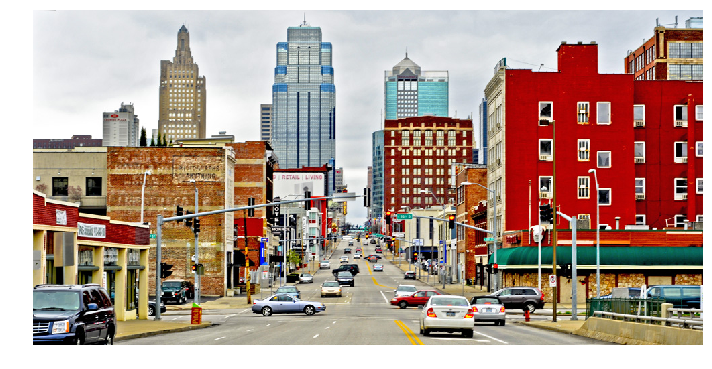

(500, 999, 3)


In [5]:
# display image
plot_single_image(image_raw)
print(image_raw.shape)

In [6]:
# preprocess image (basic cropping)
# image dimensions (GLOBAL) - [MG_WIDTH x IMG_HEIGHT, CHANNELS]
SQUARE_DIM = 450
if SQUARE_DIM:
    IMG_WIDTH = SQUARE_DIM
    IMG_HEIGHT = SQUARE_DIM
CHANNELS = 3

In [7]:
def quick_approx_crop(image, square_size):
    height, width, channels = image.shape
    xoff = (width - square_size) // 2
    yoff = (height - square_size) // 2
    # quick and dirty way to handle img that has odd dim size
    w_adj = 0
    h_adj = 0
    if width % 2 != 0:
        w_adj += 1
    if height % 2 != 0:
        h_adj += 1
    img_cropped = image[yoff+h_adj:-yoff,xoff+w_adj:-xoff]
    return img_cropped

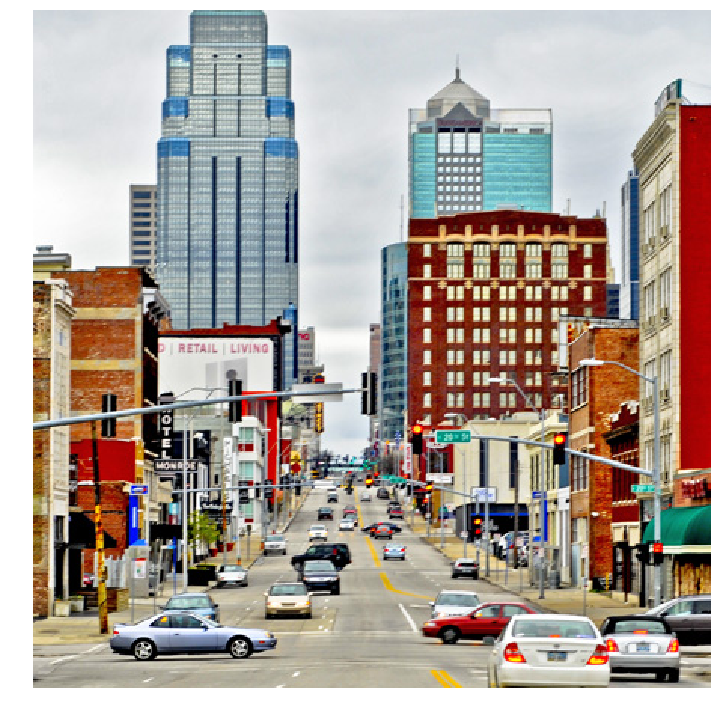

[215 219 218]
(450, 450, 3)


In [8]:
cropped_img = quick_approx_crop(image_raw, SQUARE_DIM)
plot_single_image(cropped_img)
print(cropped_img[200][200])
print(cropped_img.shape)

In [9]:
def concat_to_outputDim(fmap, channels):
    out_map = np.expand_dims(fmap, axis=3)
    fmap = np.expand_dims(fmap, axis=3)
    for i in range(channels-1):
        out_map = np.concatenate((out_map, fmap), axis=3)
    return out_map

In [10]:
# used to stack our filter such that we get an "expected" output
def create_rgb_fmap_stack(fmap):
    IN_CHAN = 3
    OUT_CHAN = 3
    outz = np.zeros([fmap.shape[0],fmap.shape[1],IN_CHAN,OUT_CHAN])
    # OUT=[R]GB, IN=[R]GB
    outz[:,:,0,0] = fmap.copy()
    outz[:,:,1,0] = np.zeros([fmap.shape[0],fmap.shape[1]])
    outz[:,:,2,0] = np.zeros([fmap.shape[0],fmap.shape[1]])
    
    # OUT: R[G]B, IN=R[G]B
    outz[:,:,0,1] = np.zeros([fmap.shape[0],fmap.shape[1]])
    outz[:,:,1,1] = fmap.copy()
    outz[:,:,2,1] = np.zeros([fmap.shape[0],fmap.shape[1]])
    
    # OUT: RG[B], IN=RG[B]
    outz[:,:,0,2] = np.zeros([fmap.shape[0],fmap.shape[1]])
    outz[:,:,1,2] = np.zeros([fmap.shape[0],fmap.shape[1]])
    outz[:,:,2,2] = fmap.copy()
    
    return outz

# used to bring output "images"(feature maps) back to "color"
def min_max_scaling(img):
    outz = np.zeros_like(img)
    min_0 = np.min(img[:,:,0])
    max_0 = np.max(img[:,:,0])
    min_1 = np.min(img[:,:,1])
    max_1 = np.max(img[:,:,1])
    min_2 = np.min(img[:,:,2])
    max_2 = np.max(img[:,:,2])
    
    outz[:,:,0] = ((outx[:,:,0] - min_0) / (max_0 - (min_0)))*255#*((max_0-min_0)+min_0)
    outz[:,:,1] = ((outx[:,:,1] - min_1) / (max_1 - (min_1)))*255#*((max_1-min_1)+min_1)
    outz[:,:,2] = ((outx[:,:,2] - min_2) / (max_2 - (min_2)))*255#*((max_2-min_2)+min_2)
    
    return outz

## Kernel Creation
Let's create some kernels.  Normally, when demonstrating convolutions+kernels, a grayscale image (one channel) will be used.  This makes ~everything much easier.  However, I wanted to try and apply these convolutions to images with n channels (in this case 3, RGB).  The output will not be perfect (the colors will be slightly off, but the basic idea is there).  Please see [wikipedia](https://goo.gl/7nH2Pw)  for more information on common kernels.

In [11]:
v_kernel = np.asarray([[0, 1, 0],
                       [0, 1, 0],
                       [0, 1, 0]], dtype=np.float32)
v_kernel = create_rgb_fmap_stack(v_kernel)

h_kernel = np.asarray([[0, 0, 0],
                       [1, 1, 1],
                       [0, 0, 0]], dtype=np.float32)
h_kernel = create_rgb_fmap_stack(h_kernel)

identity_kernel = np.asarray([[0, 0, 0,],
                              [0, 1, 0,],
                              [0, 0, 0,]], dtype=np.float32)
identity_kernel = create_rgb_fmap_stack(identity_kernel)

avg_kernel = np.asarray([[1, 1, 1,],
                         [1, 1, 1,],
                         [1, 1, 1,]], dtype=np.float32)
avg_kernel = create_rgb_fmap_stack(avg_kernel)

edge_kernel = np.asarray([[0, 1, 0,],
                          [1, -4, 1,],
                          [0, 1, 0,]], dtype=np.float32)
edge_kernel = create_rgb_fmap_stack(edge_kernel)

sharpen_kernel = np.asarray([[0, -1, 0,],
                             [-1, 5, -1,],
                             [0, -1, 0,]], dtype=np.float32)
sharpen_kernel = create_rgb_fmap_stack(sharpen_kernel)

emboss_kernel = np.asarray([[-2, -1, 0,],
                            [-1, 1, 1,],
                            [0, 1, 2,]], dtype=np.float32)
emboss_kernel = create_rgb_fmap_stack(emboss_kernel)

sobel_x_kernel = np.asarray([[1, 0, -1,],
                             [2, 0, -2,],
                             [1, 0, -1,]], dtype=np.float32)
sobel_x_kernel = create_rgb_fmap_stack(sobel_x_kernel)

sobel_y_kernel = np.asarray([[1, 2, 1,],
                             [0, 0, 0,],
                             [-1, -2, -1,]], dtype=np.float32)
sobel_y_kernel = create_rgb_fmap_stack(sobel_y_kernel)

## Visualizing the feature maps

[[ 0.  0.  0.]
 [ 1.  1.  1.]
 [ 0.  0.  0.]]


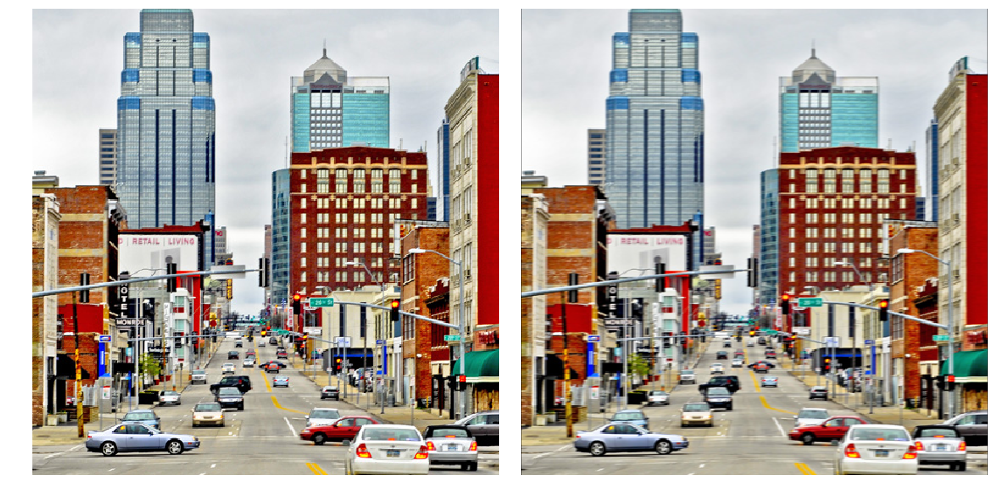

In [12]:
out = tf.nn.conv2d(input=np.expand_dims(cropped_img, axis=0).astype(np.float32), 
                   filter=h_kernel, strides=[1,1,1,1], padding="SAME")
outx = np.asarray(out)[0]
outz = min_max_scaling(outx)
print(h_kernel[:,:,0,0])
plot_side_by_side(cropped_img, outz)

[[ 0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 1.  1.  1.  1.  1.  1.  1.  1.  1.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.]]


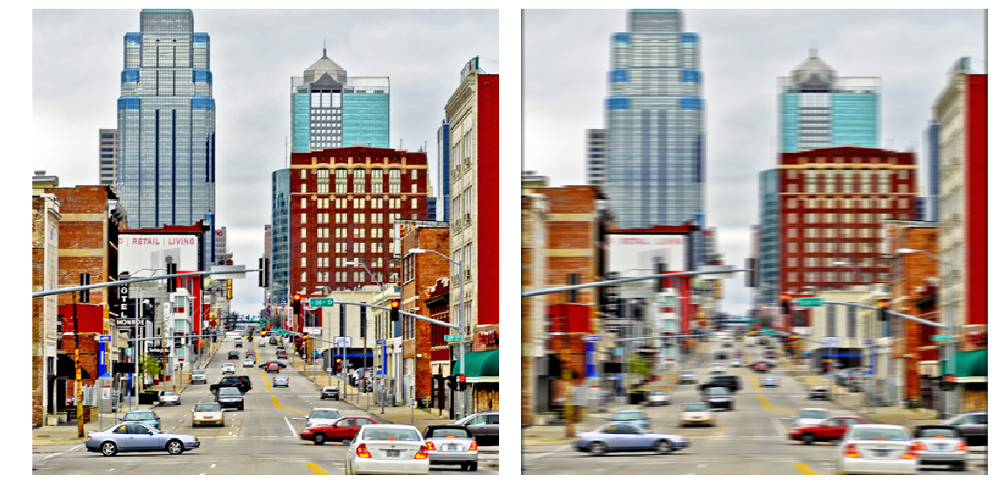

In [13]:
large_h_kernel = np.asarray([[0, 0, 0, 0, 0, 0, 0, 0, 0],
                             [0, 0, 0, 0, 0, 0, 0, 0, 0],
                             [0, 0, 0, 0, 0, 0, 0, 0, 0],
                             [0, 0, 0, 0, 0, 0, 0, 0, 0],
                             [1, 1, 1, 1, 1, 1, 1, 1, 1],
                             [0, 0, 0, 0, 0, 0, 0, 0, 0],
                             [0, 0, 0, 0, 0, 0, 0, 0, 0],
                             [0, 0, 0, 0, 0, 0, 0, 0, 0],
                             [0, 0, 0, 0, 0, 0, 0, 0, 0]], dtype=np.float32)
large_h_kernel = create_rgb_fmap_stack(large_h_kernel)
out = tf.nn.conv2d(input=np.expand_dims(cropped_img, axis=0).astype(np.float32), 
                   filter=large_h_kernel, strides=[1,1,1,1], padding="SAME")
outx = np.asarray(out)[0]
outz = min_max_scaling(outx)
print(large_h_kernel[:,:,0,0])
plot_side_by_side(cropped_img, outz)

[[ 0.  1.  0.]
 [ 0.  1.  0.]
 [ 0.  1.  0.]]


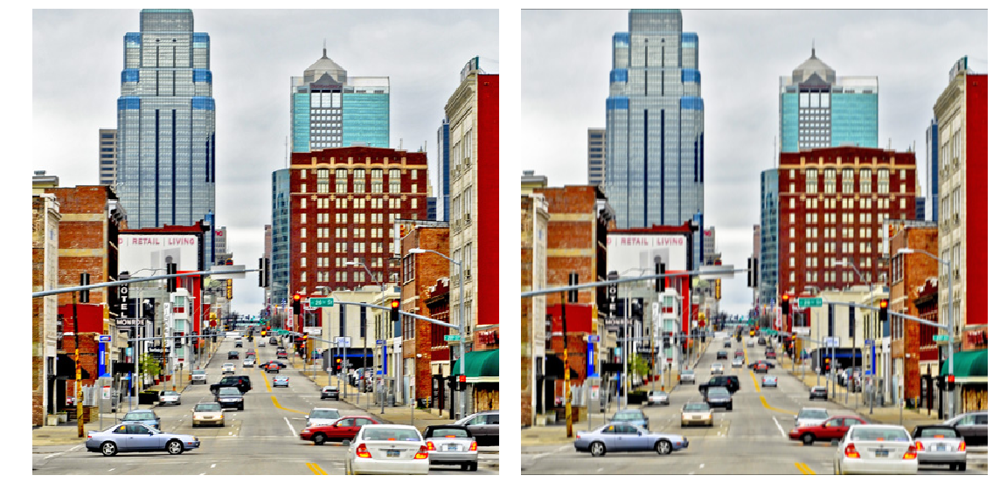

In [14]:
out = tf.nn.conv2d(input=np.expand_dims(cropped_img, axis=0).astype(np.float32), 
                   filter=v_kernel, strides=[1,1,1,1], padding="SAME")
outx = np.asarray(out)[0]
outz = min_max_scaling(outx)
print(v_kernel[:,:,0,0])
plot_side_by_side(cropped_img, outz)

[[ 0.  0.  0.]
 [ 0.  1.  0.]
 [ 0.  0.  0.]]


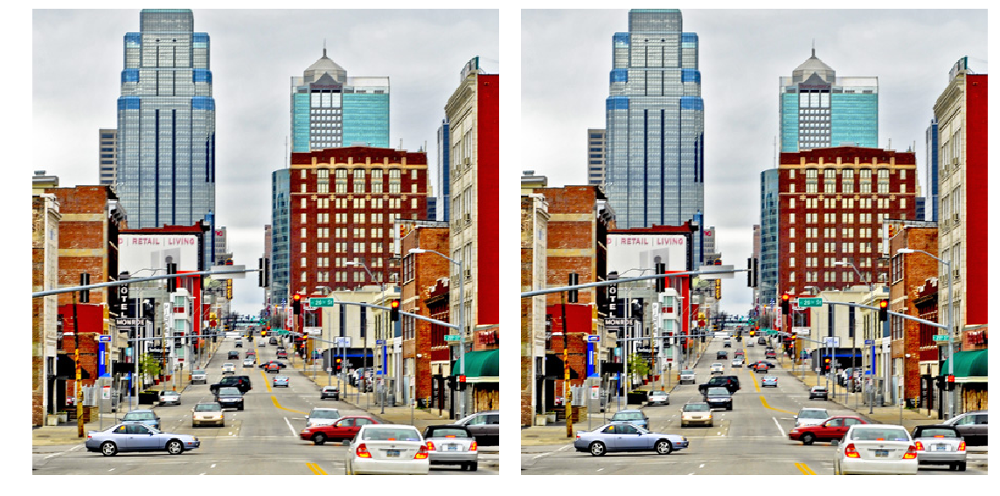

In [15]:
out = tf.nn.conv2d(input=np.expand_dims(cropped_img, axis=0).astype(np.float32), 
                   filter=identity_kernel, strides=[1,1,1,1], padding="SAME")
outx = np.asarray(out)[0]
outz = min_max_scaling(outx)
print(identity_kernel[:,:,0,0])
plot_side_by_side(cropped_img, outz)

[[ 1.  1.  1.]
 [ 1.  1.  1.]
 [ 1.  1.  1.]]


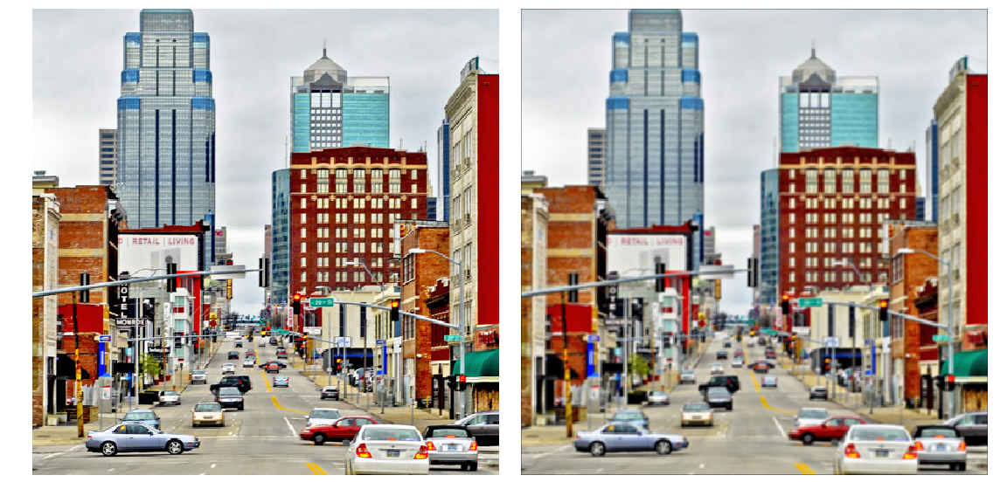

In [16]:
out = tf.nn.conv2d(input=np.expand_dims(cropped_img, axis=0).astype(np.float32), 
                   filter=avg_kernel, strides=[1,1,1,1], padding="SAME")
outx = np.asarray(out)[0]
outz = min_max_scaling(outx)
print(avg_kernel[:,:,0,0])
plot_side_by_side(cropped_img, outz)

[[ 0.  1.  0.]
 [ 1. -4.  1.]
 [ 0.  1.  0.]]


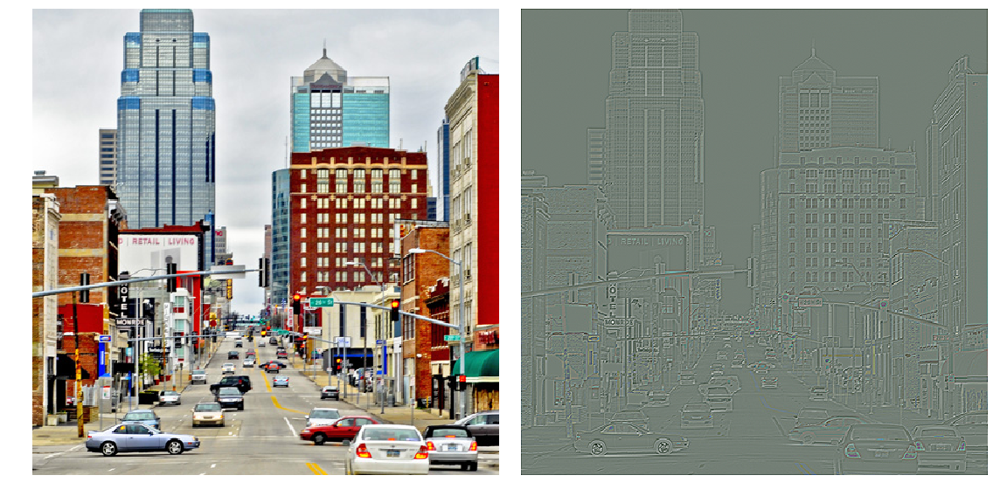

In [17]:
out = tf.nn.conv2d(input=np.expand_dims(cropped_img, axis=0).astype(np.float32), 
                   filter=edge_kernel, strides=[1,1,1,1], padding="SAME")
outx = np.asarray(out)[0]
outz = min_max_scaling(outx)
print(edge_kernel[:,:,0,0])
plot_side_by_side(cropped_img, outz)

[[ 0. -1.  0.]
 [-1.  5. -1.]
 [ 0. -1.  0.]]


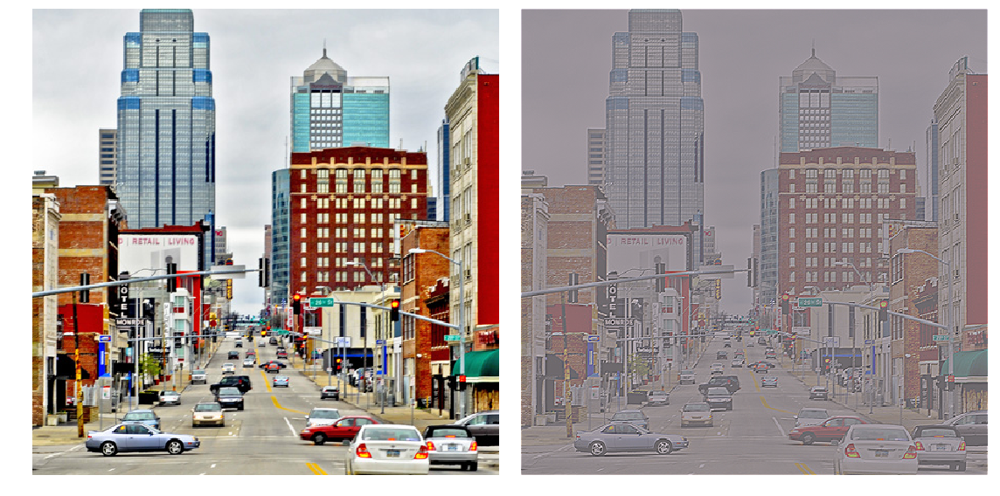

In [18]:
out = tf.nn.conv2d(input=np.expand_dims(cropped_img, axis=0).astype(np.float32), 
                   filter=sharpen_kernel, strides=[1,1,1,1], padding="SAME")
outx = np.asarray(out)[0]
outz = min_max_scaling(outx)
print(sharpen_kernel[:,:,0,0])
plot_side_by_side(cropped_img, outz)

[[-2. -1.  0.]
 [-1.  1.  1.]
 [ 0.  1.  2.]]


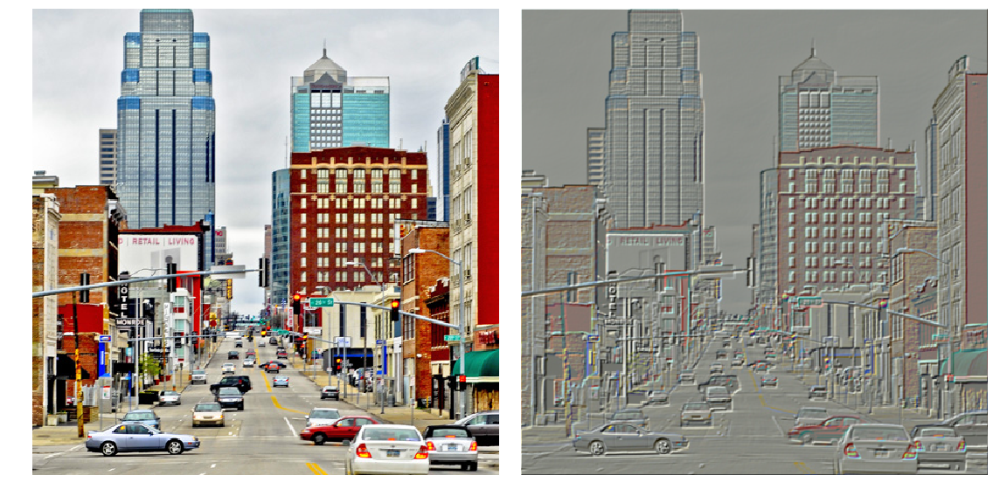

In [19]:
out = tf.nn.conv2d(input=np.expand_dims(cropped_img, axis=0).astype(np.float32), 
                   filter=emboss_kernel, strides=[1,1,1,1], padding="SAME")
outx = np.asarray(out)[0]
outz = min_max_scaling(outx)
print(emboss_kernel[:,:,0,0])
plot_side_by_side(cropped_img, outz)

[[ 1.  0. -1.]
 [ 2.  0. -2.]
 [ 1.  0. -1.]]


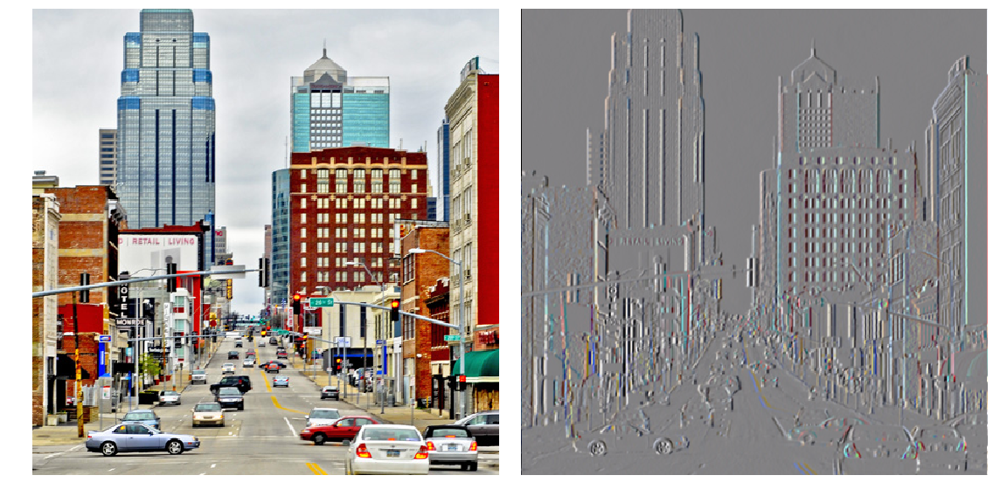

In [20]:
out = tf.nn.conv2d(input=np.expand_dims(cropped_img, axis=0).astype(np.float32), 
                   filter=sobel_x_kernel, strides=[1,1,1,1], padding="SAME")
outx = np.asarray(out)[0]
outz = min_max_scaling(outx)
print(sobel_x_kernel[:,:,0,0])
plot_side_by_side(cropped_img, outz)

[[ 1.  2.  1.]
 [ 0.  0.  0.]
 [-1. -2. -1.]]


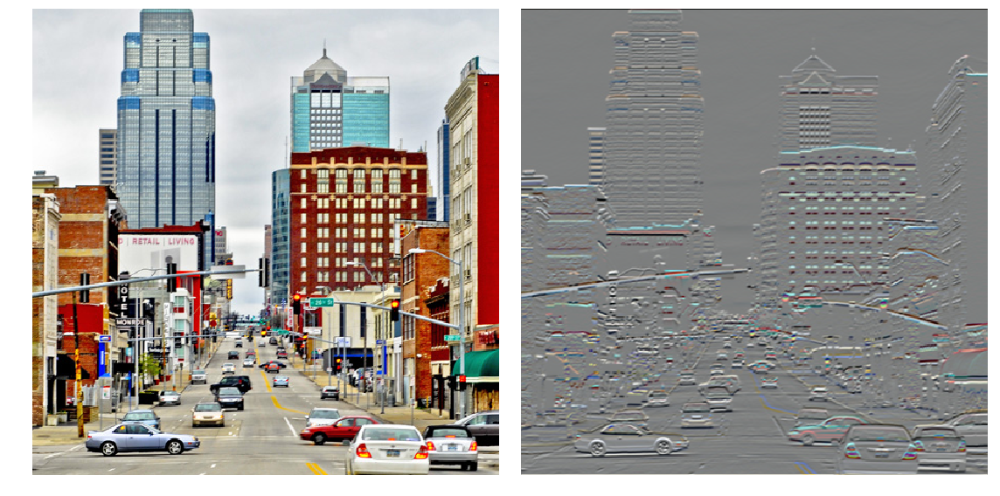

In [21]:
out = tf.nn.conv2d(input=np.expand_dims(cropped_img, axis=0).astype(np.float32), 
                   filter=sobel_y_kernel, strides=[1,1,1,1], padding="SAME")
outx = np.asarray(out)[0]
outz = min_max_scaling(outx)
print(sobel_y_kernel[:,:,0,0])
plot_side_by_side(cropped_img, outz)